In [1]:
try:
    import elasticsearch
    from elasticsearch import Elasticsearch
    
    import pandas as pd
    import matplotlib.pyplot as plt
    import matplotlib.image as mpimg
    import json
    from ast import literal_eval
    from tqdm import tqdm
    import datetime
    import os
    import sys
    import numpy as np
    from deepface import DeepFace
    from deepface.basemodels import Facenet
    from deepface.commons import functions
    
    from elasticsearch import helpers
    print("Loaded  .. . . . . . . .")
except Exception as E:
    print("Some Modules are Missing {} ".format(e))

Loaded  .. . . . . . . .


In [ ]:
#connect to ES

In [2]:
ENDPOINT = "http://localhost:9200"
ELASTIC_PASSWORD = "BOqImJW1ylurZX77d=eo"

In [3]:
#es = Elasticsearch(hosts=ENDPOINT,basic_auth=("elastic", ELASTIC_PASSWORD))
es = Elasticsearch(hosts=ENDPOINT, basic_auth =("elastic","BOqImJW1ylurZX77d=eo"))
es.ping()

True

In [4]:
os.listdir()

['.ipynb_checkpoints',
 '101_ObjectCategories.tar',
 '101_ObjectCategories.tar.gz',
 '6613_1.ipynb',
 '6613_2.ipynb',
 'archive (1).zip',
 'caltech101',
 'cat.jpg',
 'class_ids-caltech101.pickle',
 'code.ipynb',
 'Docker Desktop Installer.exe',
 'Elastic_KNN.ipynb',
 'elastic_search.csv',
 'ES',
 'ES TEST-Copy1.ipynb',
 'features-caltech101-resnet-finetuned.pickle',
 'features-caltech101-resnet.pickle',
 'filenames-caltech101.pickle',
 'final-project-presentation-Lin Tang.pptx',
 'lfw',
 'model-finetuned.h5',
 'netflix_titles.csv',
 'Sage_Test',
 'visual-search-engine-master.zip']

In [ ]:
# find generated vector file

In [5]:
df= pd.read_csv("elastic_search.csv")
#df.head(1)
df['Path'][2]

'drive/My Drive/nyu second semester/artificial intelligence/ai_project/Cody/LFW/deepfunneled/lfw-deepfunneled/Aaron_Eckhart/Aaron_Eckhart_0001.jpg'

In [6]:
titles = df["Path"].to_list()

In [7]:
len(titles)
print(titles[0].replace('drive/My Drive/nyu second semester/artificial intelligence/ai_project/Cody/LFW/deepfunneled/lfw-deepfunneled/','' ))

AJ_Cook/AJ_Cook_0001.jpg


In [8]:
#rename the file 

new_title = []
for i in range(len(titles)):
    temp_title = titles[i].replace('drive/My Drive/nyu second semester/artificial intelligence/ai_project/Cody/LFW/deepfunneled/lfw-deepfunneled','' )
    new_title.append(temp_title.replace('.jpg', ''))
new_title

['/AJ_Cook/AJ_Cook_0001',
 '/AJ_Lamas/AJ_Lamas_0001',
 '/Aaron_Eckhart/Aaron_Eckhart_0001',
 '/Aaron_Guiel/Aaron_Guiel_0001',
 '/Aaron_Patterson/Aaron_Patterson_0001',
 '/Aaron_Peirsol/Aaron_Peirsol_0001',
 '/Aaron_Peirsol/Aaron_Peirsol_0002',
 '/Aaron_Peirsol/Aaron_Peirsol_0003',
 '/Aaron_Peirsol/Aaron_Peirsol_0004',
 '/Aaron_Pena/Aaron_Pena_0001',
 '/Aaron_Sorkin/Aaron_Sorkin_0001',
 '/Aaron_Sorkin/Aaron_Sorkin_0002',
 '/Aaron_Tippin/Aaron_Tippin_0001',
 '/Abba_Eban/Abba_Eban_0001',
 '/Abbas_Kiarostami/Abbas_Kiarostami_0001',
 '/Abdel_Aziz_Al-Hakim/Abdel_Aziz_Al-Hakim_0001',
 '/Abdel_Madi_Shabneh/Abdel_Madi_Shabneh_0001',
 '/Abdel_Nasser_Assidi/Abdel_Nasser_Assidi_0001',
 '/Abdel_Nasser_Assidi/Abdel_Nasser_Assidi_0002',
 '/Abdoulaye_Wade/Abdoulaye_Wade_0001',
 '/Abdoulaye_Wade/Abdoulaye_Wade_0002',
 '/Abdoulaye_Wade/Abdoulaye_Wade_0003',
 '/Abdoulaye_Wade/Abdoulaye_Wade_0004',
 '/Abdul_Majeed_Shobokshi/Abdul_Majeed_Shobokshi_0001',
 '/Abdul_Rahman/Abdul_Rahman_0001',
 '/Abdulaziz_Kam

In [9]:
Image_Vectors = df["Representations"].to_list()
len(Image_Vectors)

12949

In [ ]:
# convert vector in CSV to array (was string type in csv which can;t be push into ES)

In [10]:
def convert_str(string):
  convert = []
  string = string[1:-1].split()
  for i in range(len(string)):
    convert.append(float(string[i]))
  return convert

In [11]:
new_vector = []
for i in range(len(titles)):    
    temp = np.asarray(Image_Vectors[i])
    #print(type(temp.tolist()))
    new_vector.append(convert_str(temp.tolist()))
len(new_vector[1])


128

In [ ]:
#generate code that will be pushed into ES

In [ ]:
requests = []
for i, doc in enumerate(new_title):
    request = {}
    request["_op_type"] = "index"
    request["_index"] = "team_20_knn"
    request["_id"] = i
    request["my-tag"] = doc
    request["my-image-vector"] = new_vector[i]
    requests.append(request)

In [ ]:
requests

In [ ]:
#use bulk to push all image/title and image/vector to ES

In [ ]:
try:
    res = helpers.bulk(es, requests)
    print("Working")
except Exception as e:
    print(e)

In [12]:
#choose random image vector here, for test

get_usr_input = int(input("Enter a Number between 0-13000: "))
print(new_title[get_usr_input])

Enter a Number between 0-13000: 209
/Albert_Costa/Albert_Costa_0005


In [14]:
#searching query generated

script_query = {
"knn": {
    "field": "my-image-vector",
    "query_vector": new_vector[get_usr_input],
    "k": 20,
    "num_candidates": 100
  }
}
#print(script_query)
response = es.knn_search(
    index="team_20_knn",
    body=script_query
)


In [15]:
import cv2
temp_test = str(new_title[get_usr_input])
temp_test = temp_test.replace('/', '\\')
path  = r'C:\Users\djain\Documents\2022_Spring\6613 AI\project\lfw\lfw-deepfunneled\lfw_deepfunneled' + str(temp_test) +'.jpg'
print(path)


C:\Users\djain\Documents\2022_Spring\6613 AI\project\lfw\lfw-deepfunneled\lfw_deepfunneled\Albert_Costa\Albert_Costa_0005.jpg


(-0.5, 249.5, 249.5, -0.5)

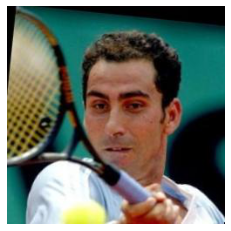

In [16]:
img = mpimg.imread(str(path))
plt.imshow(img)
plt.axis('off')

In [17]:
name = []
ids = []
scores = []
image_path = []
img_tmp = []
for hit in response["hits"]["hits"]:
    print("id: {}, score: {}".format(hit["_id"], hit["_score"]))
    print(hit["_source"]["my-tag"])
    temp_test = hit["_source"]["my-tag"]
    name.append(temp_test)
    ids.append(hit["_id"])
    scores.append(hit["_score"])
    temp_test = temp_test.replace('/', '\\')
    path  = r'C:\Users\djain\Documents\2022_Spring\6613 AI\project\lfw\lfw-deepfunneled\lfw_deepfunneled' + str(temp_test) +'.jpg'
    image_path.append(path)
    img_tmp.append(mpimg.imread(str(path)))


id: 209, score: 1.0
/Albert_Costa/Albert_Costa_0005
id: 210, score: 0.012452976
/Albert_Costa/Albert_Costa_0006
id: 206, score: 0.012118504
/Albert_Costa/Albert_Costa_0002
id: 208, score: 0.010838277
/Albert_Costa/Albert_Costa_0004
id: 2510, score: 0.008026955
/Daniel_Montenegro/Daniel_Montenegro_0001
id: 8272, score: 0.007670024
/Maria_Sanchez_Lorenzo/Maria_Sanchez_Lorenzo_0001
id: 12610, score: 0.007622111
/Wally_Szczerbiak/Wally_Szczerbiak_0001
id: 207, score: 0.007359735
/Albert_Costa/Albert_Costa_0003
id: 8213, score: 0.007282615
/Marat_Safin/Marat_Safin_0002
id: 4774, score: 0.0071884594
/Guillermo_Canas/Guillermo_Canas_0003
id: 5575, score: 0.006998471
/Jake_Gyllenhaal/Jake_Gyllenhaal_0004
id: 8239, score: 0.0069355145
/Marcelo_Salas/Marcelo_Salas_0003
id: 8366, score: 0.0068707964
/Mark_Heller/Mark_Heller_0001
id: 3523, score: 0.0067682867
/Fernando_Alonso/Fernando_Alonso_0001
id: 205, score: 0.0067654583
/Albert_Costa/Albert_Costa_0001
id: 9912, score: 0.0066144937
/Pete_Sampr

In [66]:
print(name[0])

/Albert_Costa/Albert_Costa_0005


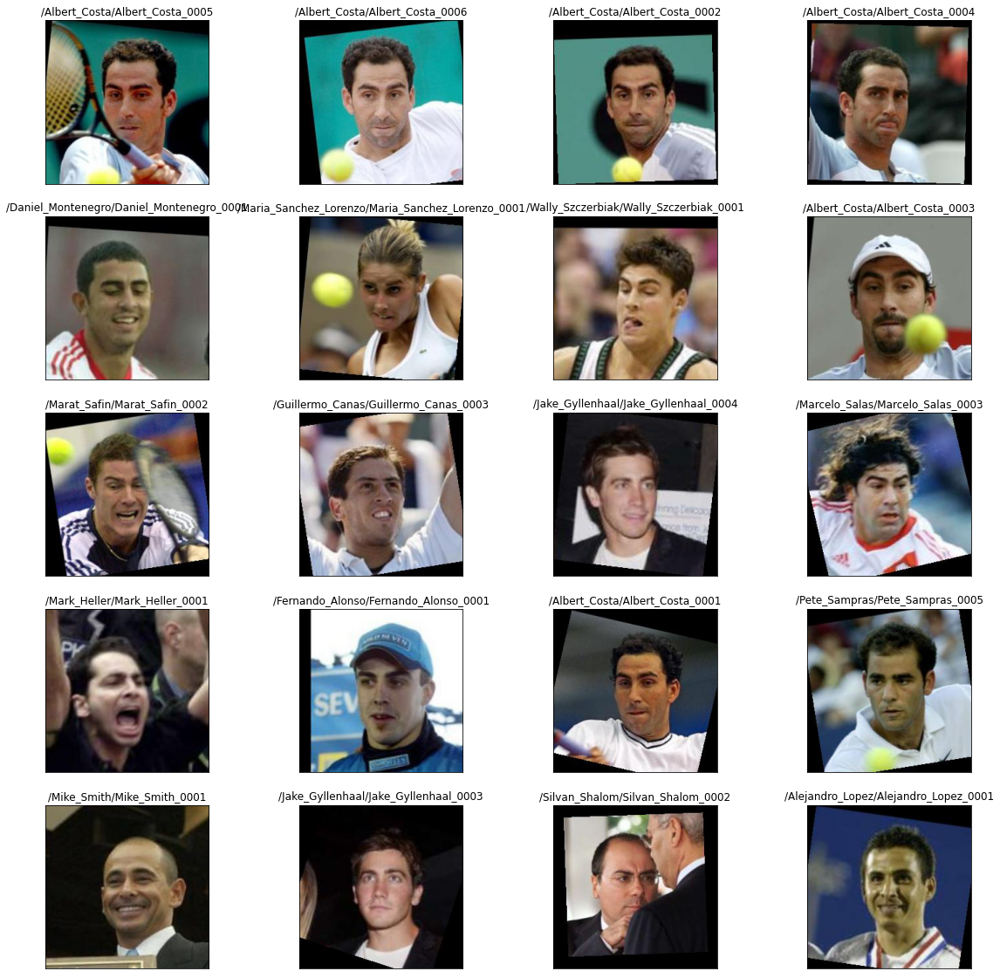

In [19]:
rows = 4
columns = 5
#fig = plt.figure(figsize=(15, 15))
#fig, ax = plt.subplots(rows, columns)
plt.figure(figsize=(20,20))
xx = 0
for i in range(len(name)):
    output_img = mpimg.imread(image_path[i])
    title_temp= name[i]
    xx += 1
    plt.subplot(5,4,xx)
    plt.imshow(output_img)
    plt.xticks([]), plt.yticks([])
    plt.title(title_temp)
    
                         
plt.show()

In [20]:
def find_and_plt():
    get_usr_input = int(input("Enter a Number between 0-13000: "))
    script_query = {
    "knn": {
        "field": "my-image-vector",
        "query_vector": new_vector[get_usr_input],
        "k": 20,
        "num_candidates": 100
      }
    }
    #print(script_query)
    response = es.knn_search(
        index="team_20_knn",
        body=script_query
    )
    name = []
    ids = []
    scores = []
    image_path = []
    img_tmp = []
    for hit in response["hits"]["hits"]:
        #print("id: {}, score: {}".format(hit["_id"], hit["_score"]))
        #print(hit["_source"]["my-tag"])
        temp_test = hit["_source"]["my-tag"]
        name.append(temp_test)
        ids.append(hit["_id"])
        scores.append(hit["_score"])
        temp_test = temp_test.replace('/', '\\')
        path  = r'C:\Users\djain\Documents\2022_Spring\6613 AI\project\lfw\lfw-deepfunneled\lfw_deepfunneled' + str(temp_test) +'.jpg'
        image_path.append(path)
        img_tmp.append(mpimg.imread(str(path)))

    plt.figure(figsize=(20,20))
    xx = 0
    for i in range(len(name)):
        output_img = mpimg.imread(image_path[i])
        title_temp= name[i]
        xx += 1
        plt.subplot(5,4,xx)
        plt.imshow(output_img)
        plt.xticks([]), plt.yticks([])
        plt.title(title_temp)


    plt.show()

Enter a Number between 0-13000: 209


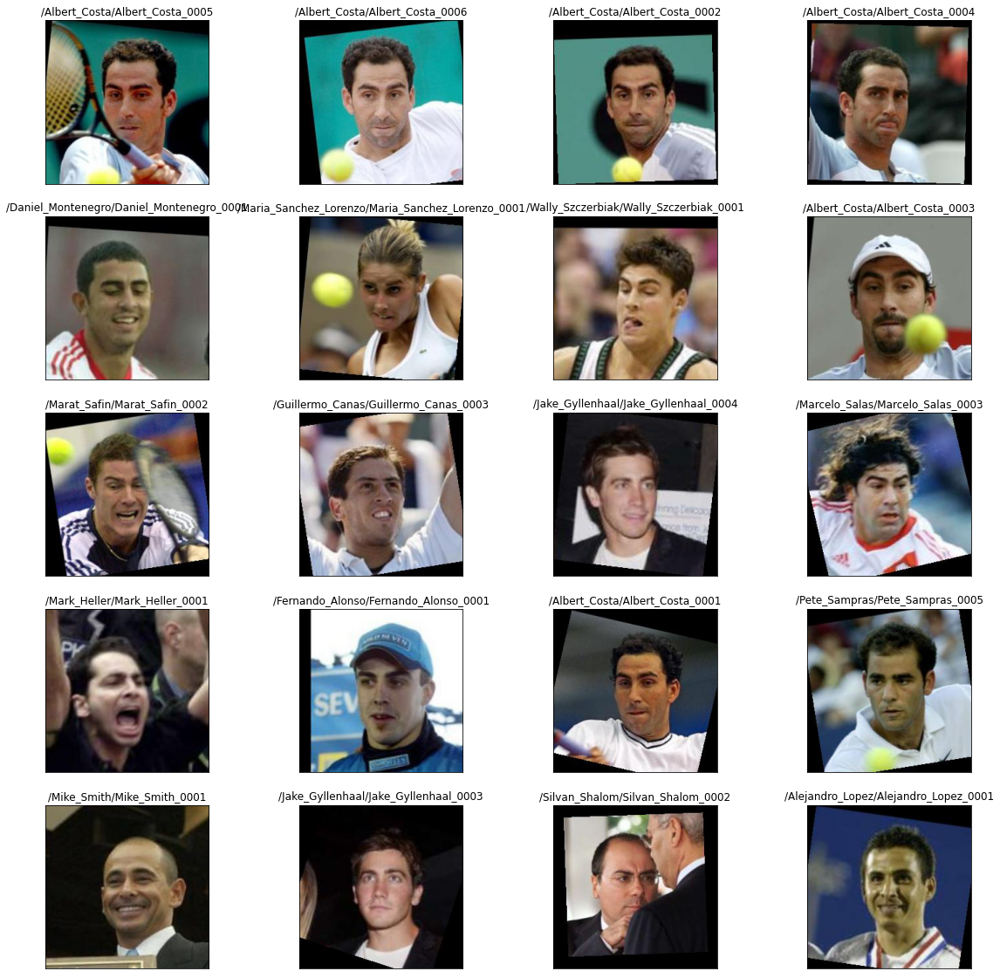

In [21]:
find_and_plt()

In [22]:
model = Facenet.loadModel()
target_path = r"C:\Users\djain\Documents\2022_Spring\6613 AI\project\lfw\lfw-deepfunneled\lfw_deepfunneled\Albert_Costa\Albert_Costa_0006.jpg"
target_img = functions.preprocess_face(target_path, target_size = (160, 160))
target_embedding = model.predict(target_img)[0]
x = np.asarray(target_embedding)

In [26]:
def find_and_plt(file_path):
    model = Facenet.loadModel()
    #get_usr_input = int(input("Enter a Number between 0-13000: "))
    target_img = functions.preprocess_face(file_path, target_size = (160, 160))
    target_embedding = model.predict(target_img)[0]
    given_plt_vector = np.asarray(target_embedding)
    script_query = {
    "knn": {
        "field": "my-image-vector",
        "query_vector": given_plt_vector,
        "k": 20,
        "num_candidates": 100
      }
    }
    #print(script_query)
    response = es.knn_search(
        index="team_20_knn",
        body=script_query
    )
    name = []
    ids = []
    scores = []
    image_path = []
    img_tmp = []
    for hit in response["hits"]["hits"]:
        print("id: {}, score: {}".format(hit["_id"], hit["_score"]))
        print(hit["_source"]["my-tag"])
        print()
        temp_test = hit["_source"]["my-tag"]
        name.append(temp_test)
        ids.append(hit["_id"])
        scores.append(hit["_score"])
        temp_test = temp_test.replace('/', '\\')
        path  = r'C:\Users\djain\Documents\2022_Spring\6613 AI\project\lfw\lfw-deepfunneled\lfw_deepfunneled' + str(temp_test) +'.jpg'
        image_path.append(path)
        img_tmp.append(mpimg.imread(str(path)))
    plt.figure(figsize=(20,20))
    xx = 0
    for i in range(len(name)):
        output_img = mpimg.imread(image_path[i])
        title_temp= name[i]
        xx += 1
        plt.subplot(5,4,xx)
        plt.imshow(output_img)
        plt.xticks([]), plt.yticks([])
        plt.title(title_temp)


    plt.show()

# 10 random faces /20 per query

id: 210, score: 1.0
/Albert_Costa/Albert_Costa_0006

id: 206, score: 0.01936175
/Albert_Costa/Albert_Costa_0002

id: 209, score: 0.012452981
/Albert_Costa/Albert_Costa_0005

id: 208, score: 0.0106206415
/Albert_Costa/Albert_Costa_0004

id: 235, score: 0.007880534
/Alejandro_Fernandez/Alejandro_Fernandez_0001

id: 29, score: 0.0076307375
/Abdullah/Abdullah_0004

id: 3789, score: 0.007612259
/George_Clooney/George_Clooney_0009

id: 5575, score: 0.007511422
/Jake_Gyllenhaal/Jake_Gyllenhaal_0004

id: 4774, score: 0.0074670077
/Guillermo_Canas/Guillermo_Canas_0003

id: 9918, score: 0.0073126494
/Pete_Sampras/Pete_Sampras_0011

id: 6940, score: 0.0070599373
/Joxel_Garcia/Joxel_Garcia_0001

id: 2130, score: 0.0070298933
/Colin_Farrell/Colin_Farrell_0008

id: 11507, score: 0.00702503
/Stephen_Oake/Stephen_Oake_0001

id: 4561, score: 0.007004586
/Gilberto_Simoni/Gilberto_Simoni_0001

id: 207, score: 0.0069121937
/Albert_Costa/Albert_Costa_0003

id: 2131, score: 0.0069059147
/Colin_Farrell/Colin

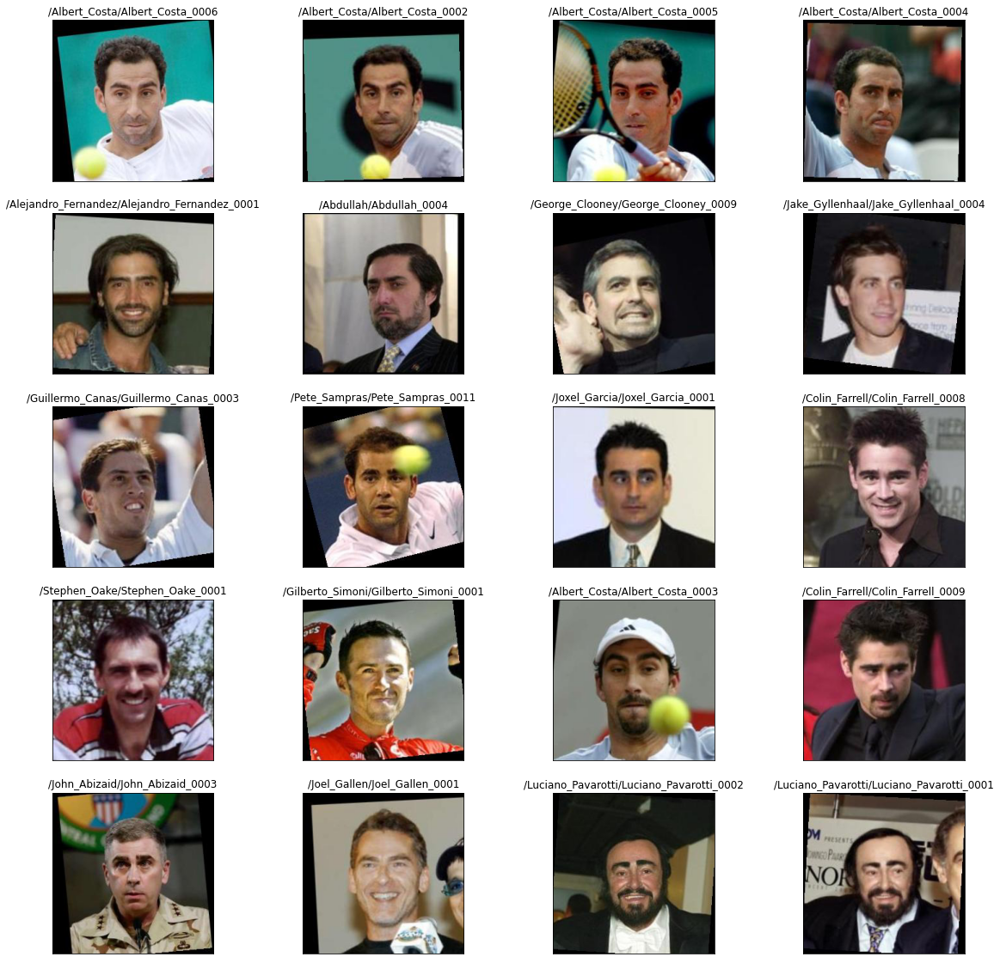

In [27]:
find_and_plt( r"C:\Users\djain\Documents\2022_Spring\6613 AI\project\lfw\lfw-deepfunneled\lfw_deepfunneled\Albert_Costa\Albert_Costa_0006.jpg")

id: 628, score: 1.0
/Angela_Bassett/Angela_Bassett_0001

id: 632, score: 0.029962342
/Angela_Bassett/Angela_Bassett_0005

id: 629, score: 0.02285136
/Angela_Bassett/Angela_Bassett_0002

id: 631, score: 0.017883575
/Angela_Bassett/Angela_Bassett_0004

id: 386, score: 0.017816838
/Allyson_Felix/Allyson_Felix_0001

id: 9449, score: 0.013615621
/Nikki_McKibbin/Nikki_McKibbin_0001

id: 390, score: 0.012897403
/Allyson_Felix/Allyson_Felix_0005

id: 387, score: 0.0121753225
/Allyson_Felix/Allyson_Felix_0002

id: 9237, score: 0.011854745
/Naomi_Campbell/Naomi_Campbell_0001

id: 3454, score: 0.0115329875
/Eunice_Barber/Eunice_Barber_0001

id: 12370, score: 0.011427427
/Tyra_Banks/Tyra_Banks_0001

id: 12537, score: 0.010797021
/Vivica_Fox/Vivica_Fox_0001

id: 12442, score: 0.010383015
/Venus_Williams/Venus_Williams_0008

id: 9238, score: 0.010363993
/Naomi_Campbell/Naomi_Campbell_0002

id: 12538, score: 0.010080558
/Vivica_Fox/Vivica_Fox_0002

id: 388, score: 0.009946894
/Allyson_Felix/Allyson_F

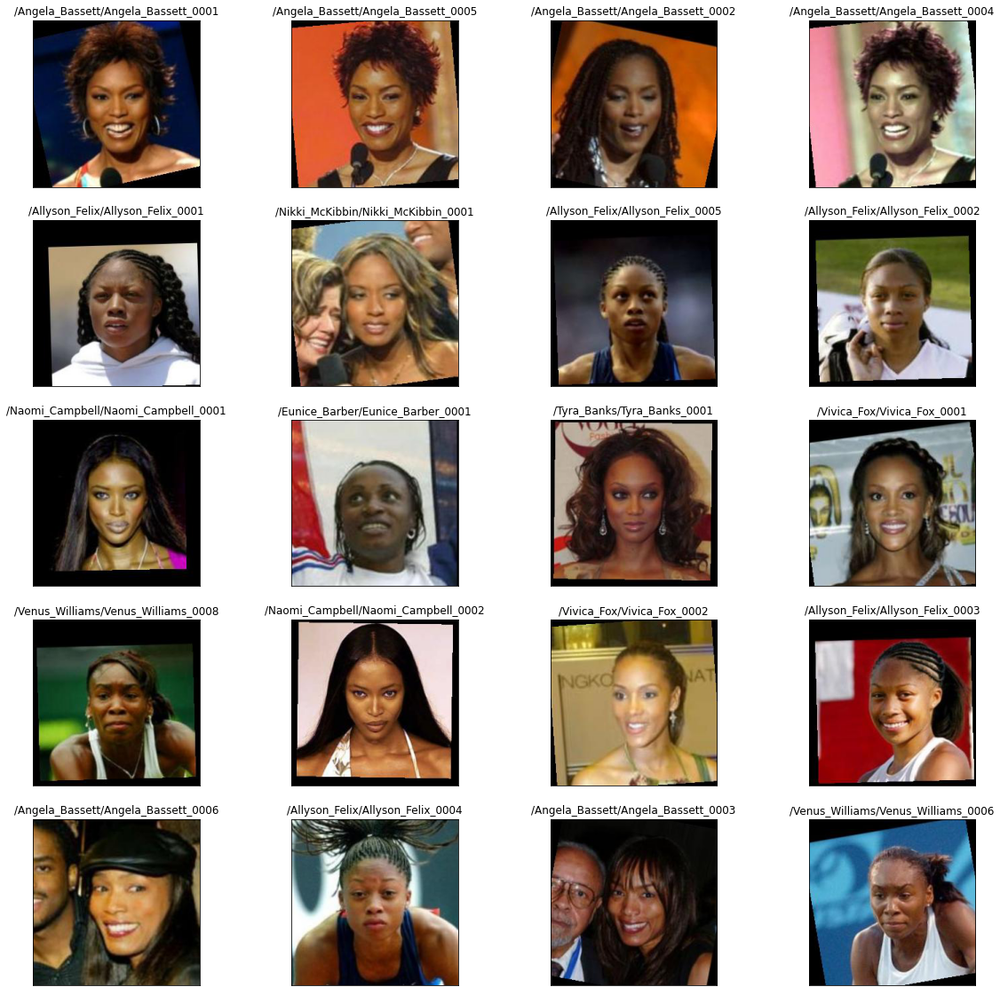

In [28]:
find_and_plt( r"C:\Users\djain\Documents\2022_Spring\6613 AI\project\lfw\lfw-deepfunneled\lfw_deepfunneled\Angela_Bassett\Angela_Bassett_0001.jpg")

id: 890, score: 1.0
/Arminio_Fraga/Arminio_Fraga_0005

id: 888, score: 0.023573298
/Arminio_Fraga/Arminio_Fraga_0003

id: 889, score: 0.019595366
/Arminio_Fraga/Arminio_Fraga_0004

id: 887, score: 0.018167304
/Arminio_Fraga/Arminio_Fraga_0002

id: 891, score: 0.016782897
/Arminio_Fraga/Arminio_Fraga_0006

id: 5719, score: 0.0073823957
/Jan_van_Breda_Kolff/Jan_van_Breda_Kolff_0001

id: 10163, score: 0.0073041925
/Rafael_Bielsa/Rafael_Bielsa_0001

id: 7011, score: 0.0071641365
/Juergen_Peters/Juergen_Peters_0001

id: 1538, score: 0.007145351
/Bruce_Springsteen/Bruce_Springsteen_0001

id: 12036, score: 0.0069422647
/Tom_McClintock/Tom_McClintock_0001

id: 10956, score: 0.0067732413
/Ryan_Drese/Ryan_Drese_0001

id: 2638, score: 0.0066921087
/David_Dewayne_Williams/David_Dewayne_Williams_0001

id: 12708, score: 0.0065937513
/William_Ford_Jr/William_Ford_Jr_0004

id: 4855, score: 0.006496332
/Hal_Gehman/Hal_Gehman_0004

id: 12799, score: 0.006425563
/Xanana_Gusmao/Xanana_Gusmao_0005

id: 338

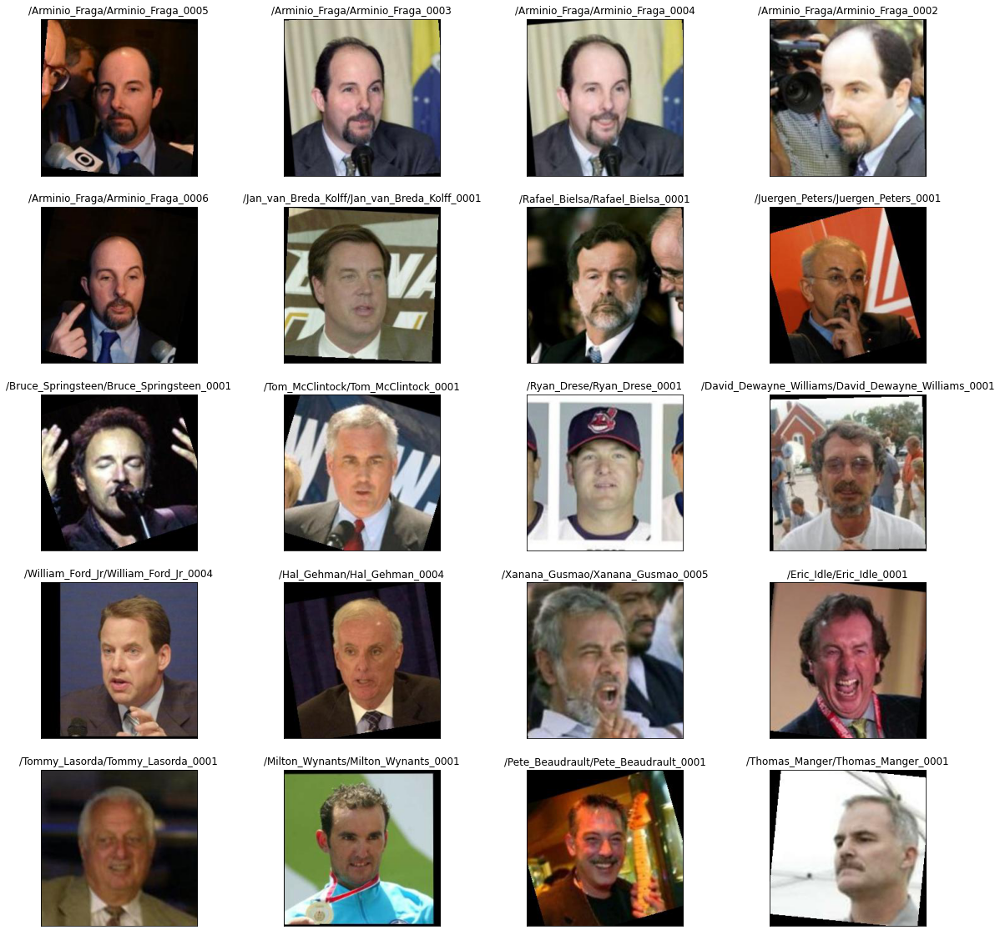

In [29]:
find_and_plt( r"C:\Users\djain\Documents\2022_Spring\6613 AI\project\lfw\lfw-deepfunneled\lfw_deepfunneled\Arminio_Fraga\Arminio_Fraga_0005.jpg")

id: 1311, score: 1.0
/Billy_Crystal/Billy_Crystal_0001

id: 1315, score: 0.012032778
/Billy_Crystal/Billy_Crystal_0005

id: 3377, score: 0.007775495
/Enrique_Medina_Gomez/Enrique_Medina_Gomez_0001

id: 1314, score: 0.007570311
/Billy_Crystal/Billy_Crystal_0004

id: 9814, score: 0.007545962
/Paul_Wilson/Paul_Wilson_0001

id: 182, score: 0.007498967
/Alan_Dreher/Alan_Dreher_0001

id: 2719, score: 0.007325897
/David_Wells/David_Wells_0003

id: 1254, score: 0.0072990544
/Bill_Herrion/Bill_Herrion_0001

id: 8577, score: 0.007272922
/Matthew_Perry/Matthew_Perry_0004

id: 5288, score: 0.007237427
/Hugo_Chavez/Hugo_Chavez_0069

id: 4132, score: 0.007138547
/George_W_Bush/George_W_Bush_0269

id: 123, score: 0.0070705977
/Ahmed_Ghazi/Ahmed_Ghazi_0001

id: 6764, score: 0.0070395786
/Jon_Corzine/Jon_Corzine_0001

id: 8667, score: 0.006976841
/Mercedes_Amor/Mercedes_Amor_0001

id: 6359, score: 0.00682745
/Joe_Dicaro/Joe_Dicaro_0001

id: 5285, score: 0.006789468
/Hugo_Chavez/Hugo_Chavez_0066

id: 52

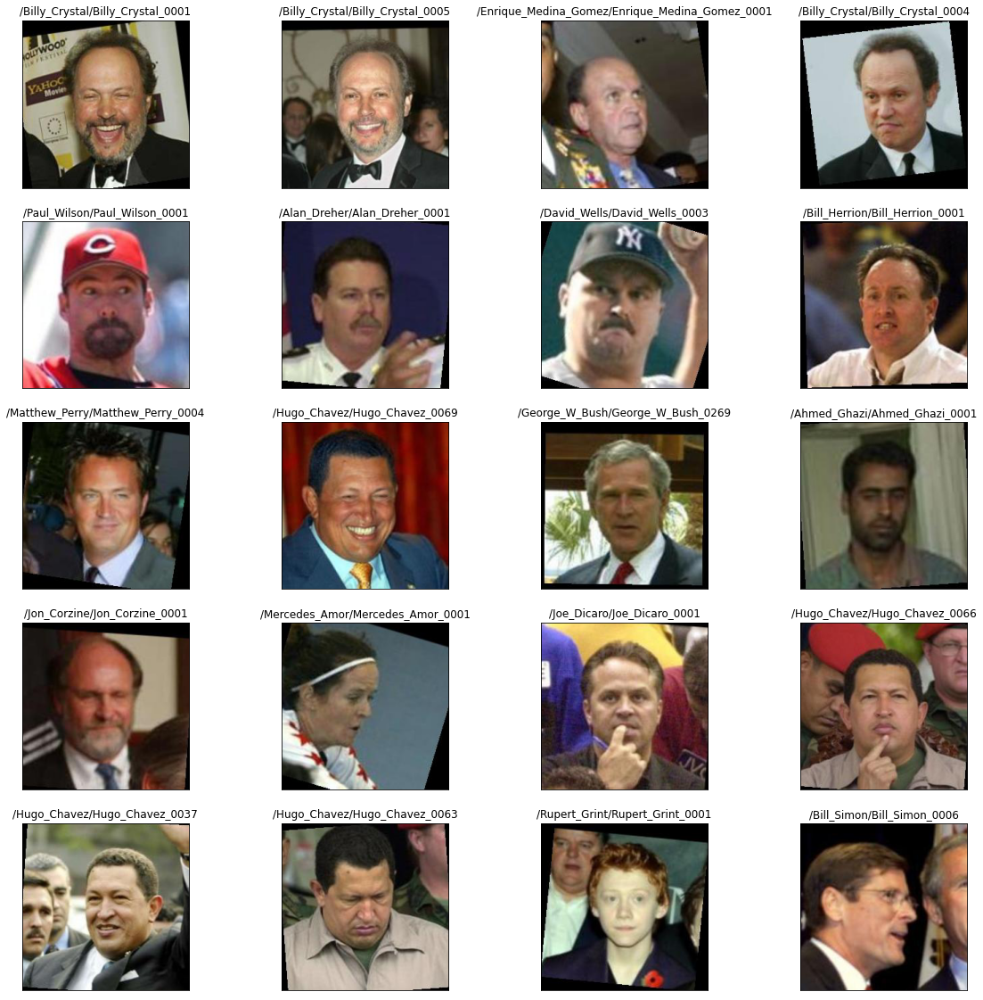

In [30]:
find_and_plt( r"C:\Users\djain\Documents\2022_Spring\6613 AI\project\lfw\lfw-deepfunneled\lfw_deepfunneled\Billy_Crystal\Billy_Crystal_0001.jpg")

id: 1363, score: 1.0
/Bob_Graham/Bob_Graham_0001

id: 1368, score: 0.014592382
/Bob_Graham/Bob_Graham_0006

id: 1367, score: 0.011560331
/Bob_Graham/Bob_Graham_0005

id: 2845, score: 0.010686109
/Dick_Armey/Dick_Armey_0001

id: 1841, score: 0.010037702
/Charles_Cope/Charles_Cope_0001

id: 1366, score: 0.01001789
/Bob_Graham/Bob_Graham_0004

id: 1365, score: 0.009675671
/Bob_Graham/Bob_Graham_0003

id: 11734, score: 0.009601182
/Tatiana_Paus/Tatiana_Paus_0001

id: 6736, score: 0.009137241
/John_Walsh/John_Walsh_0002

id: 10626, score: 0.008749806
/Robert_Horan/Robert_Horan_0002

id: 1364, score: 0.008747377
/Bob_Graham/Bob_Graham_0002

id: 8864, score: 0.008618697
/Michelangelo_Antonioni/Michelangelo_Antonioni_0001

id: 5416, score: 0.008613423
/Itzhak_Perlman/Itzhak_Perlman_0001

id: 7985, score: 0.008546849
/Luc_Montagnier/Luc_Montagnier_0001

id: 6930, score: 0.008380656
/Joseph_Ralston/Joseph_Ralston_0002

id: 10037, score: 0.008302249
/Pierre_Pettigrew/Pierre_Pettigrew_0003

id: 12

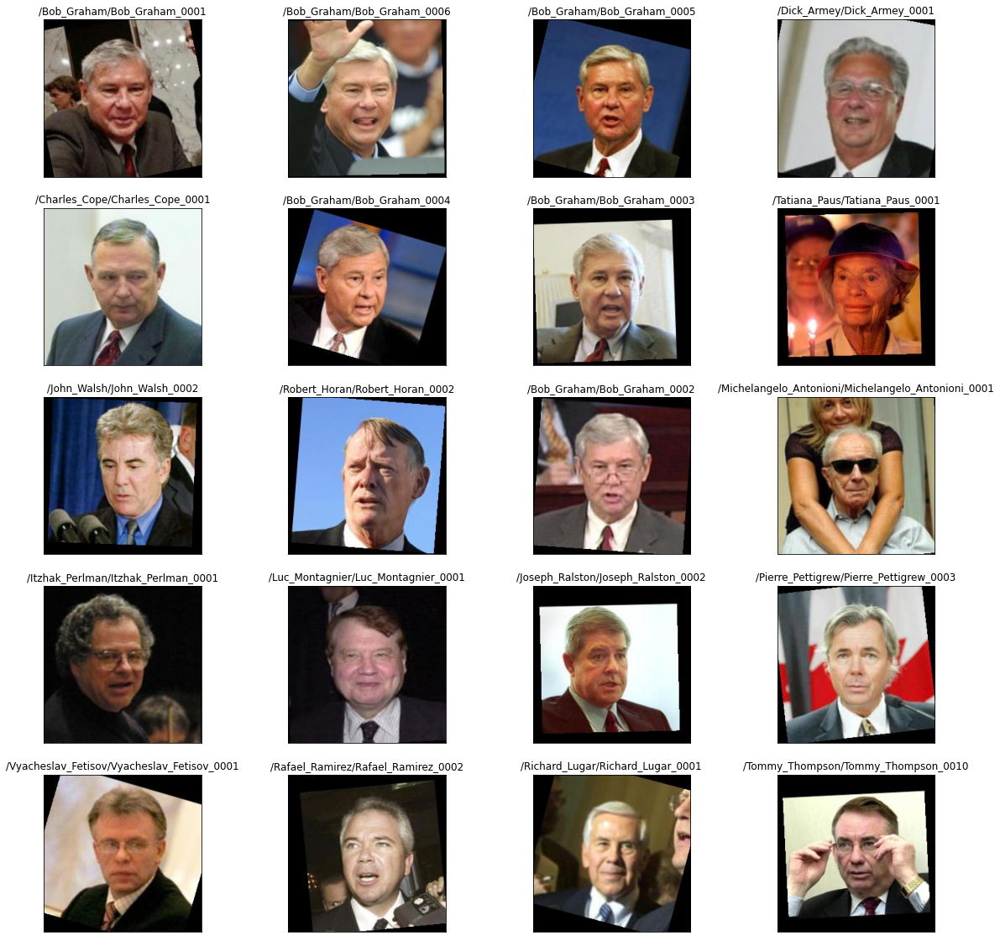

In [31]:
find_and_plt( r"C:\Users\djain\Documents\2022_Spring\6613 AI\project\lfw\lfw-deepfunneled\lfw_deepfunneled\Bob_Graham\Bob_Graham_0001.jpg")

id: 1415, score: 1.0
/Boris_Becker/Boris_Becker_0001

id: 1418, score: 0.012240263
/Boris_Becker/Boris_Becker_0004

id: 1420, score: 0.011741646
/Boris_Becker/Boris_Becker_0006

id: 1419, score: 0.0112129785
/Boris_Becker/Boris_Becker_0005

id: 1417, score: 0.01062317
/Boris_Becker/Boris_Becker_0003

id: 1416, score: 0.009534429
/Boris_Becker/Boris_Becker_0002

id: 12594, score: 0.009030301
/Vladimir_Voltchkov/Vladimir_Voltchkov_0002

id: 12593, score: 0.008399804
/Vladimir_Voltchkov/Vladimir_Voltchkov_0001

id: 2629, score: 0.007858326
/David_Caraway/David_Caraway_0002

id: 5583, score: 0.0077990107
/James_Barksdale/James_Barksdale_0001

id: 6767, score: 0.0076002767
/Jon_Gruden/Jon_Gruden_0001

id: 1303, score: 0.0075391224
/Bill_Sizemore/Bill_Sizemore_0002

id: 5421, score: 0.0074494095
/Ivan_Shvedoff/Ivan_Shvedoff_0001

id: 6289, score: 0.0074309544
/Jim_Zorn/Jim_Zorn_0001

id: 9746, score: 0.007374773
/Paul_Hogan/Paul_Hogan_0001

id: 10403, score: 0.0073130857
/Richard_Cohen/Richa

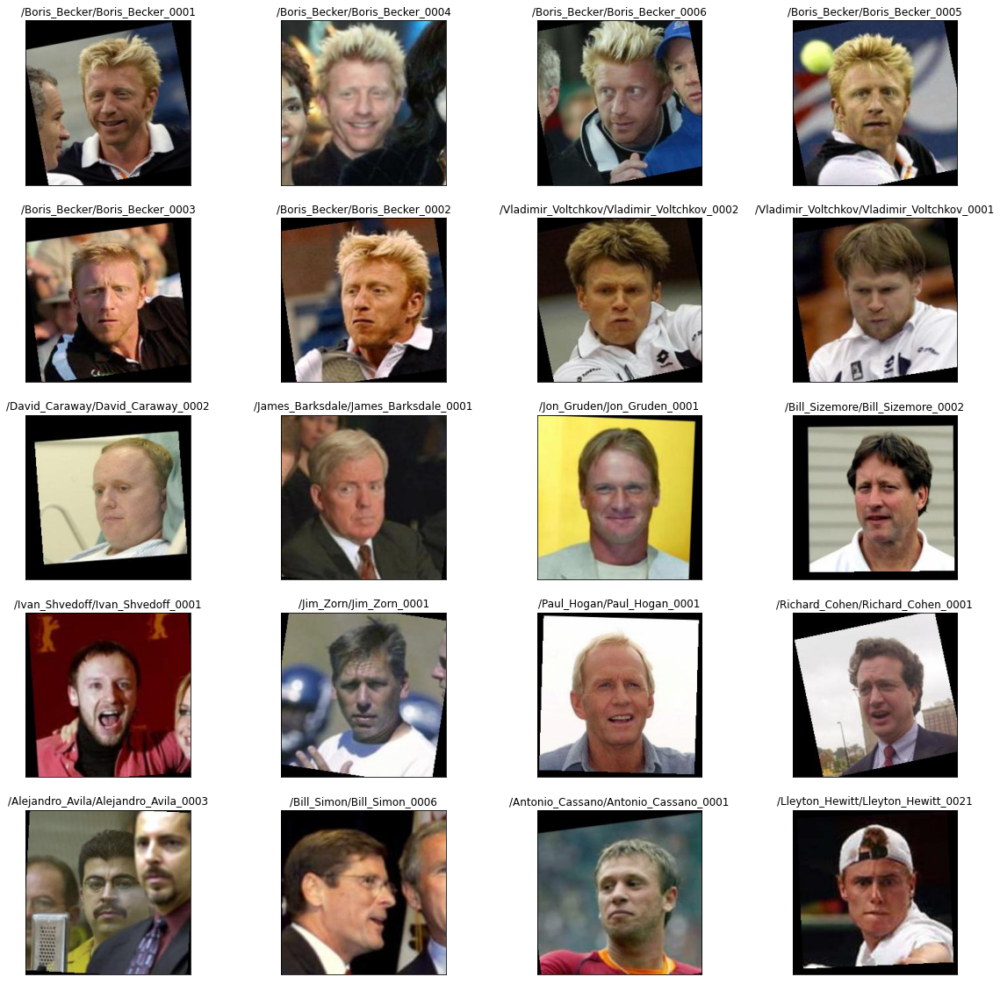

In [32]:
find_and_plt( r"C:\Users\djain\Documents\2022_Spring\6613 AI\project\lfw\lfw-deepfunneled\lfw_deepfunneled\Boris_Becker\Boris_Becker_0001.jpg")

id: 1562, score: 1.0
/Bulent_Ecevit/Bulent_Ecevit_0001

id: 1564, score: 0.013606377
/Bulent_Ecevit/Bulent_Ecevit_0003

id: 1566, score: 0.011865202
/Bulent_Ecevit/Bulent_Ecevit_0005

id: 1567, score: 0.011101659
/Bulent_Ecevit/Bulent_Ecevit_0006

id: 1565, score: 0.0098585775
/Bulent_Ecevit/Bulent_Ecevit_0004

id: 1563, score: 0.008245274
/Bulent_Ecevit/Bulent_Ecevit_0002

id: 7988, score: 0.0076959343
/Lucia_Kenny_Anthony/Lucia_Kenny_Anthony_0001

id: 6486, score: 0.007482089
/John_Blaney/John_Blaney_0001

id: 345, score: 0.0074513024
/Ali_Fallahian/Ali_Fallahian_0001

id: 2940, score: 0.0072978786
/Donald_Hays/Donald_Hays_0001

id: 8198, score: 0.007238944
/Mamdouh_Habib/Mamdouh_Habib_0001

id: 9558, score: 0.0072064186
/Osama_bin_Laden/Osama_bin_Laden_0004

id: 7990, score: 0.0069813365
/Luciano_Pavarotti/Luciano_Pavarotti_0001

id: 9369, score: 0.0068498547
/Nestor_Kirchner/Nestor_Kirchner_0037

id: 8157, score: 0.0068363524
/Mahmoud_Abbas/Mahmoud_Abbas_0001

id: 8179, score: 0.00

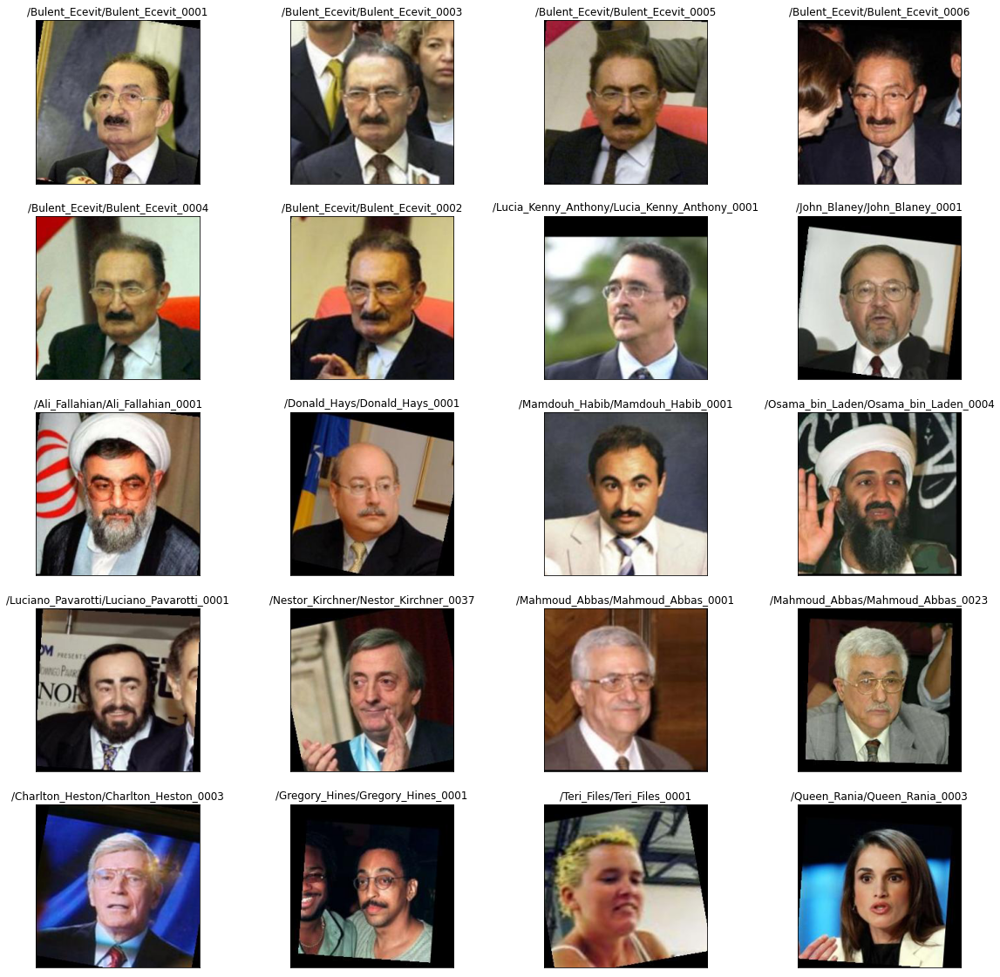

In [33]:
find_and_plt( r"C:\Users\djain\Documents\2022_Spring\6613 AI\project\lfw\lfw-deepfunneled\lfw_deepfunneled\Bulent_Ecevit\Bulent_Ecevit_0001.jpg")

id: 1577, score: 1.0
/Calista_Flockhart/Calista_Flockhart_0001

id: 1578, score: 0.01379501
/Calista_Flockhart/Calista_Flockhart_0002

id: 1580, score: 0.010590904
/Calista_Flockhart/Calista_Flockhart_0004

id: 1581, score: 0.010583447
/Calista_Flockhart/Calista_Flockhart_0005

id: 1579, score: 0.010399148
/Calista_Flockhart/Calista_Flockhart_0003

id: 1582, score: 0.00845063
/Calista_Flockhart/Calista_Flockhart_0006

id: 1740, score: 0.007965216
/Carrie-Anne_Moss/Carrie-Anne_Moss_0004

id: 7662, score: 0.0073380154
/Laura_Bush/Laura_Bush_0035

id: 7632, score: 0.0071823294
/Laura_Bush/Laura_Bush_0005

id: 7665, score: 0.007047461
/Laura_Bush/Laura_Bush_0038

id: 1739, score: 0.007004325
/Carrie-Anne_Moss/Carrie-Anne_Moss_0003

id: 7648, score: 0.0069951126
/Laura_Bush/Laura_Bush_0021

id: 7629, score: 0.006931887
/Laura_Bush/Laura_Bush_0002

id: 7657, score: 0.0068843653
/Laura_Bush/Laura_Bush_0030

id: 9025, score: 0.0068043447
/Minnie_Driver/Minnie_Driver_0001

id: 7639, score: 0.00

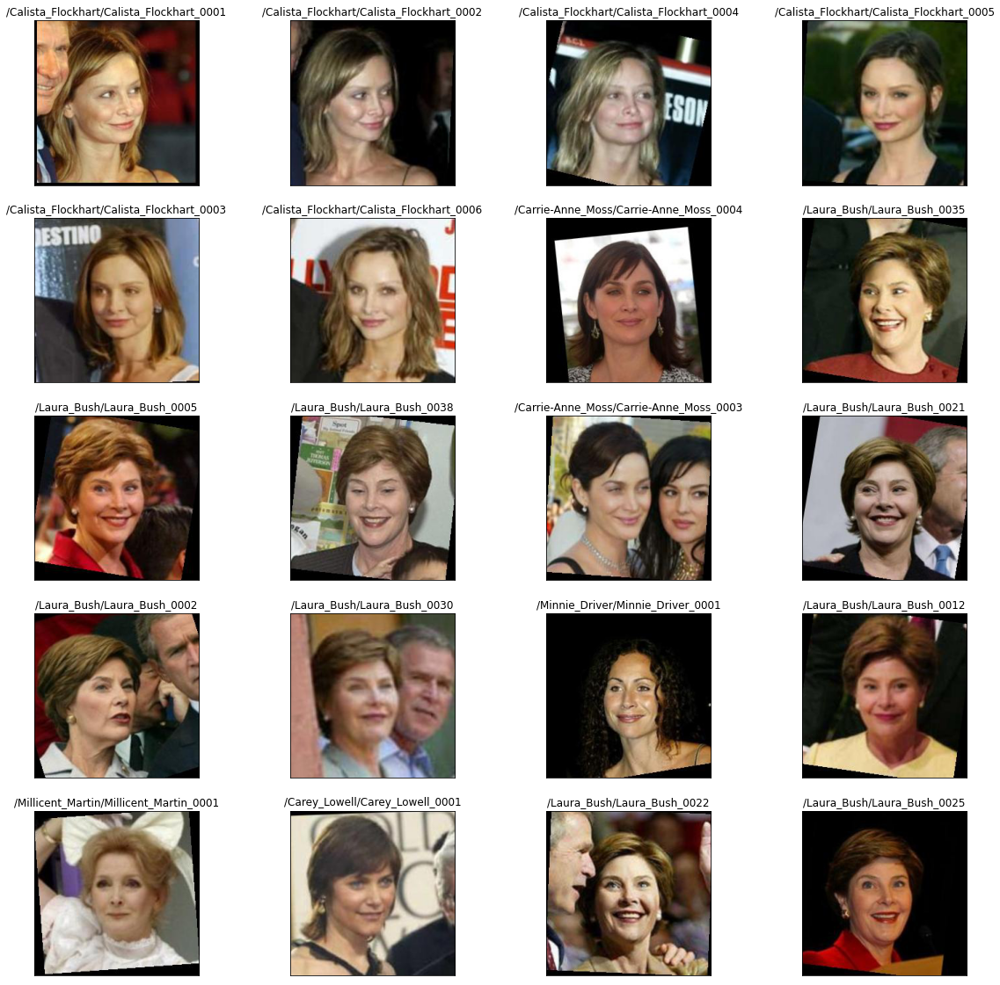

In [34]:
find_and_plt( r"C:\Users\djain\Documents\2022_Spring\6613 AI\project\lfw\lfw-deepfunneled\lfw_deepfunneled\Calista_Flockhart\Calista_Flockhart_0001.jpg")

id: 1585, score: 1.0
/Cameron_Diaz/Cameron_Diaz_0001

id: 1588, score: 0.013938894
/Cameron_Diaz/Cameron_Diaz_0004

id: 1586, score: 0.009730712
/Cameron_Diaz/Cameron_Diaz_0002

id: 6092, score: 0.009395299
/Jennifer_Lopez/Jennifer_Lopez_0013

id: 1589, score: 0.009287787
/Cameron_Diaz/Cameron_Diaz_0005

id: 7687, score: 0.008102539
/Lauren_Killian/Lauren_Killian_0001

id: 1519, score: 0.007772297
/Britney_Spears/Britney_Spears_0007

id: 1587, score: 0.007735882
/Cameron_Diaz/Cameron_Diaz_0003

id: 6083, score: 0.0073207566
/Jennifer_Lopez/Jennifer_Lopez_0004

id: 10089, score: 0.0072657163
/Princess_Diana/Princess_Diana_0001

id: 6082, score: 0.007265058
/Jennifer_Lopez/Jennifer_Lopez_0003

id: 7510, score: 0.0071402616
/Kristin_Chenoweth/Kristin_Chenoweth_0001

id: 5998, score: 0.0070355334
/Jennifer_Aniston/Jennifer_Aniston_0001

id: 1053, score: 0.0068805977
/Barbora_Strycova/Barbora_Strycova_0001

id: 7010, score: 0.006794314
/Juergen_Chrobog/Juergen_Chrobog_0001

id: 5143, score:

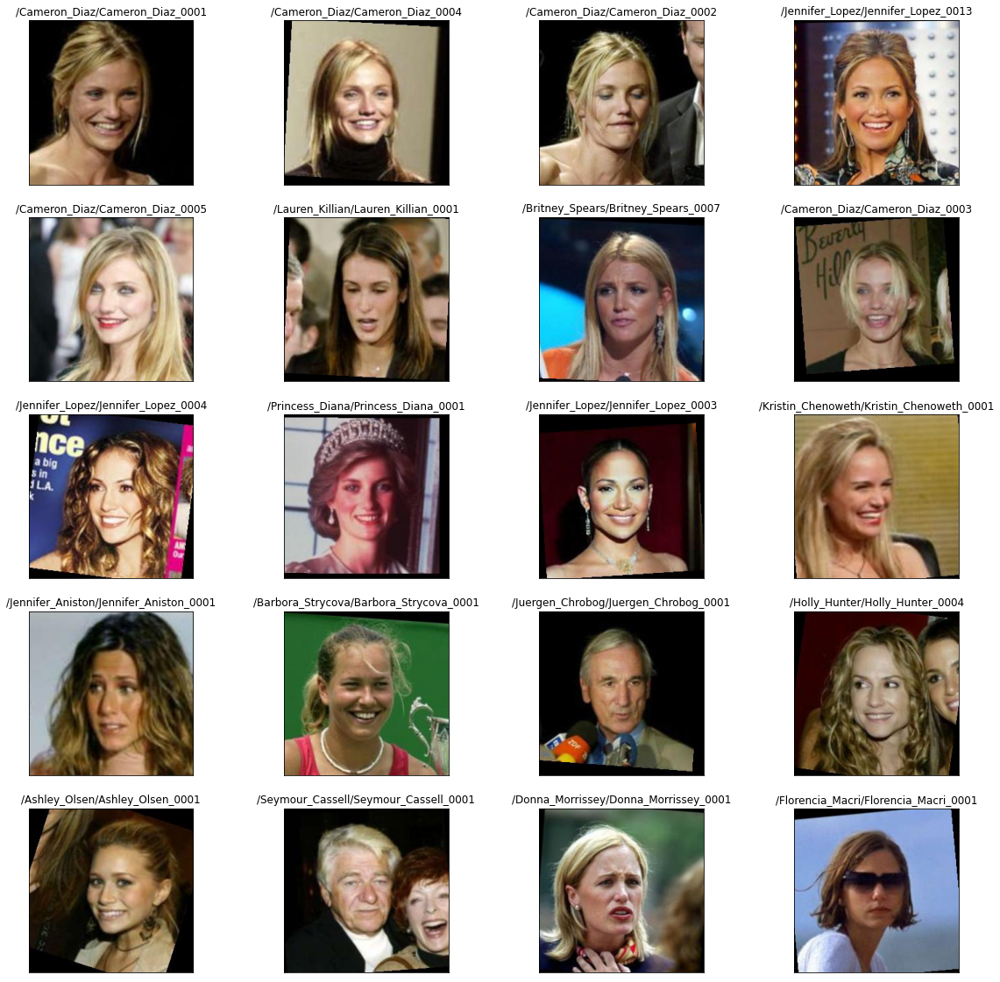

In [35]:
find_and_plt( r"C:\Users\djain\Documents\2022_Spring\6613 AI\project\lfw\lfw-deepfunneled\lfw_deepfunneled\Cameron_Diaz\Cameron_Diaz_0001.jpg")

id: 1709, score: 1.0
/Carmen_Electra/Carmen_Electra_0001

id: 1714, score: 0.01563161
/Carmen_Electra/Carmen_Electra_0006

id: 1713, score: 0.015333786
/Carmen_Electra/Carmen_Electra_0005

id: 1710, score: 0.012979382
/Carmen_Electra/Carmen_Electra_0002

id: 1711, score: 0.011885337
/Carmen_Electra/Carmen_Electra_0003

id: 1712, score: 0.009596907
/Carmen_Electra/Carmen_Electra_0004

id: 8305, score: 0.008328252
/Mariangel_Ruiz_Torrealba/Mariangel_Ruiz_Torrealba_0003

id: 7163, score: 0.007876252
/Justine_Pasek/Justine_Pasek_0005

id: 9426, score: 0.0076145018
/Nicole_Kidman/Nicole_Kidman_0002

id: 10337, score: 0.0076128487
/Renee_Zellweger/Renee_Zellweger_0016

id: 9245, score: 0.0076056086
/Naomi_Watts/Naomi_Watts_0006

id: 9244, score: 0.0075749275
/Naomi_Watts/Naomi_Watts_0005

id: 7502, score: 0.007565679
/Kristanna_Loken/Kristanna_Loken_0002

id: 6096, score: 0.007397913
/Jennifer_Lopez/Jennifer_Lopez_0017

id: 7160, score: 0.007340049
/Justine_Pasek/Justine_Pasek_0002

id: 7165

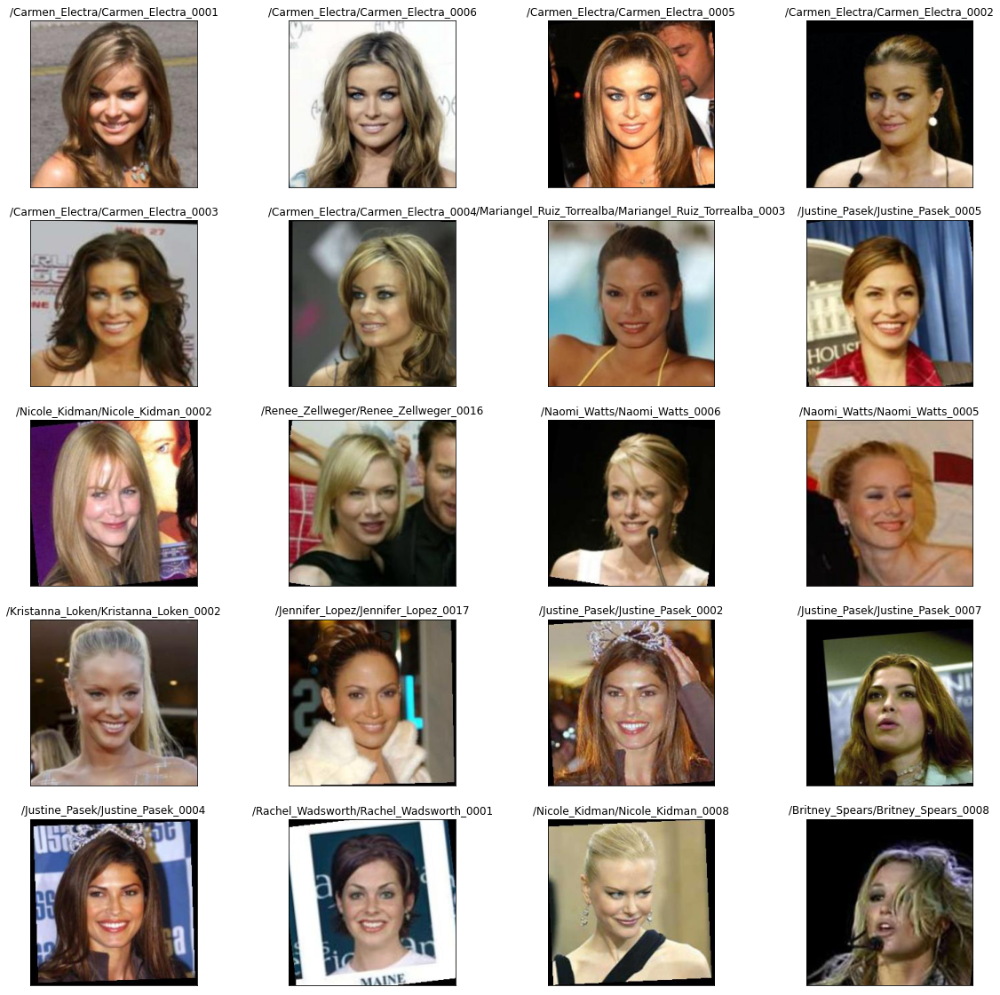

In [36]:
find_and_plt( r"C:\Users\djain\Documents\2022_Spring\6613 AI\project\lfw\lfw-deepfunneled\lfw_deepfunneled\Carmen_Electra\Carmen_Electra_0001.jpg")